In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as px
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

In [2]:
df = pd.read_csv("indian House Prices.csv")

In [3]:
df.shape

(9390, 44)

In [4]:
df.head()

,id,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,...,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator,City,Latitude,Longitude
0,0,300.00,3340,JP Nagar Phase 1,4.0,0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,12.265594,76.646540
1,1,83.58,1675,Doddanekundi,3.0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,12.971319,77.696477
2,2,68.45,1670,Kengeri,3.0,0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,12.917657,77.483757
3,3,67.97,1220,Horamavu,2.0,0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,13.027331,77.660151
4,4,200.00,2502,Thanisandra,4.0,0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,13.054713,77.633926


In [5]:
df.tail()

,id,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,...,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator,City,Latitude,Longitude
9385,24599,620.0,1450,Worli,3.0,0,1.0,1.0,1.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Mumbai,19.011696,72.818070
9386,24600,25.0,540,Virar East,1.0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mumbai,19.457969,72.814214
9387,24601,190.0,1267,Belapur,3.0,1,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mumbai,29.363160,80.723436
9388,24602,149.0,1245,Airoli,2.0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mumbai,29.656246,79.432182
9389,24603,140.0,1183,Airoli,2.0,0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mumbai,29.656246,79.432182


In [6]:
col=[df.columns[1:].values.tolist()]
col


[['Price',
  'Area',
  'Location',
  'No. of Bedrooms',
  'Resale',
  'MaintenanceStaff',
  'Gymnasium',
  'SwimmingPool',
  'LandscapedGardens',
  'JoggingTrack',
  'RainWaterHarvesting',
  'IndoorGames',
  'ShoppingMall',
  'Intercom',
  'SportsFacility',
  'ATM',
  'ClubHouse',
  'School',
  '24X7Security',
  'PowerBackup',
  'CarParking',
  'StaffQuarter',
  'Cafeteria',
  'MultipurposeRoom',
  'Hospital',
  'WashingMachine',
  'Gasconnection',
  'AC',
  'Wifi',
  "Children'splayarea",
  'LiftAvailable',
  'BED',
  'VaastuCompliant',
  'Microwave',
  'GolfCourse',
  'TV',
  'DiningTable',
  'Sofa',
  'Wardrobe',
  'Refrigerator',
  'City',
  'Latitude',
  'Longitude']]

In [7]:
df[col[0]].describe()

,Price,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator,Latitude,Longitude
count,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,...,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000,9390.000000
mean,105.614563,1354.274973,2.472311,0.352183,0.171778,0.509904,0.405644,0.342279,0.320554,0.365282,...,0.296166,0.049414,0.022258,0.056550,0.053248,0.051544,0.021832,0.051864,18.778749,74.315855
std,139.664066,719.154146,0.762603,0.477676,0.377208,0.499929,0.491042,0.474498,0.466714,0.481535,...,0.456589,0.216743,0.147528,0.230992,0.224540,0.221117,0.146142,0.221764,7.554944,18.613870
min,20.000000,200.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-28.816624,-117.147666
25%,45.000000,924.250000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.980165,77.036315
50%,70.000000,1200.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.451210,77.746994
75%,122.000000,1610.000000,3.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19.227342,79.922469
max,4000.000000,9900.000000,8.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,65.447377,127.655678


In [8]:
df.dtypes

id                       int64
Price                  float64
Area                     int64
Location                object
No. of Bedrooms        float64
Resale                   int64
MaintenanceStaff       float64
Gymnasium              float64
SwimmingPool           float64
LandscapedGardens      float64
JoggingTrack           float64
RainWaterHarvesting    float64
IndoorGames            float64
ShoppingMall           float64
Intercom               float64
SportsFacility         float64
ATM                    float64
ClubHouse              float64
School                 float64
24X7Security           float64
PowerBackup            float64
CarParking             float64
StaffQuarter           float64
Cafeteria              float64
MultipurposeRoom       float64
Hospital               float64
WashingMachine         float64
Gasconnection          float64
AC                     float64
Wifi                   float64
Children'splayarea     float64
LiftAvailable          float64
BED     

In [9]:
df.isnull().count()

id                     9390
Price                  9390
Area                   9390
Location               9390
No. of Bedrooms        9390
Resale                 9390
MaintenanceStaff       9390
Gymnasium              9390
SwimmingPool           9390
LandscapedGardens      9390
JoggingTrack           9390
RainWaterHarvesting    9390
IndoorGames            9390
ShoppingMall           9390
Intercom               9390
SportsFacility         9390
ATM                    9390
ClubHouse              9390
School                 9390
24X7Security           9390
PowerBackup            9390
CarParking             9390
StaffQuarter           9390
Cafeteria              9390
MultipurposeRoom       9390
Hospital               9390
WashingMachine         9390
Gasconnection          9390
AC                     9390
Wifi                   9390
Children'splayarea     9390
LiftAvailable          9390
BED                    9390
VaastuCompliant        9390
Microwave              9390
GolfCourse          

In [10]:
df.isnull().sum()

id                     0
Price                  0
Area                   0
Location               0
No. of Bedrooms        0
Resale                 0
MaintenanceStaff       0
Gymnasium              0
SwimmingPool           0
LandscapedGardens      0
JoggingTrack           0
RainWaterHarvesting    0
IndoorGames            0
ShoppingMall           0
Intercom               0
SportsFacility         0
ATM                    0
ClubHouse              0
School                 0
24X7Security           0
PowerBackup            0
CarParking             0
StaffQuarter           0
Cafeteria              0
MultipurposeRoom       0
Hospital               0
WashingMachine         0
Gasconnection          0
AC                     0
Wifi                   0
Children'splayarea     0
LiftAvailable          0
BED                    0
VaastuCompliant        0
Microwave              0
GolfCourse             0
TV                     0
DiningTable            0
Sofa                   0
Wardrobe               0


In [11]:
cities=df['City'].unique()
cities

array(['Banglore', 'Chennai', 'Delhi', 'Hyderabad', 'Kolkata', 'Mumbai'],
      dtype=object)

In [12]:
city=['Banglore', 'Chennai', 'Delhi', 'Hyderabad', 'Kolkata', 'Mumbai']


In [13]:
#converting  categorical data to numeric data 
c=pd.get_dummies(df['City'])
c

,Banglore,Chennai,Delhi,Hyderabad,Kolkata,Mumbai
0,1,0,0,0,0,0
1,1,0,0,0,0,0
2,1,0,0,0,0,0
3,1,0,0,0,0,0
4,1,0,0,0,0,0
...,...,...,...,...,...,...
9385,0,0,0,0,0,1
9386,0,0,0,0,0,1
9387,0,0,0,0,0,1
9388,0,0,0,0,0,1


In [14]:
#df.drop(['City'],axis=1,inplace=True)
df.head()

,id,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,...,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator,City,Latitude,Longitude
0,0,300.00,3340,JP Nagar Phase 1,4.0,0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,12.265594,76.646540
1,1,83.58,1675,Doddanekundi,3.0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,12.971319,77.696477
2,2,68.45,1670,Kengeri,3.0,0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,12.917657,77.483757
3,3,67.97,1220,Horamavu,2.0,0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,13.027331,77.660151
4,4,200.00,2502,Thanisandra,4.0,0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Banglore,13.054713,77.633926


In [15]:
import plotly.express as px

In [16]:

data = pd.concat([df,c],axis=1)
data

,id,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,...,Refrigerator,City,Latitude,Longitude,Banglore,Chennai,Delhi,Hyderabad,Kolkata,Mumbai
0,0,300.00,3340,JP Nagar Phase 1,4.0,0,1.0,1.0,1.0,1.0,...,0.0,Banglore,12.265594,76.646540,1,0,0,0,0,0
1,1,83.58,1675,Doddanekundi,3.0,0,0.0,0.0,0.0,0.0,...,0.0,Banglore,12.971319,77.696477,1,0,0,0,0,0
2,2,68.45,1670,Kengeri,3.0,0,1.0,1.0,1.0,1.0,...,0.0,Banglore,12.917657,77.483757,1,0,0,0,0,0
3,3,67.97,1220,Horamavu,2.0,0,0.0,1.0,1.0,1.0,...,0.0,Banglore,13.027331,77.660151,1,0,0,0,0,0
4,4,200.00,2502,Thanisandra,4.0,0,0.0,1.0,1.0,1.0,...,0.0,Banglore,13.054713,77.633926,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9385,24599,620.00,1450,Worli,3.0,0,1.0,1.0,1.0,1.0,...,0.0,Mumbai,19.011696,72.818070,0,0,0,0,0,1
9386,24600,25.00,540,Virar East,1.0,0,0.0,0.0,0.0,0.0,...,0.0,Mumbai,19.457969,72.814214,0,0,0,0,0,1
9387,24601,190.00,1267,Belapur,3.0,1,0.0,1.0,1.0,1.0,...,0.0,Mumbai,29.363160,80.723436,0,0,0,0,0,1
9388,24602,149.00,1245,Airoli,2.0,0,0.0,0.0,0.0,0.0,...,0.0,Mumbai,29.656246,79.432182,0,0,0,0,0,1


In [17]:
#Trying to understand the relation of price with respect to the carpet area and city of the house using a 
fig = px.scatter(df,x="City", y="Price", color="No. of Bedrooms",
                 size='Area', hover_data=['Area','Location'])
fig.show()

In [18]:
#we can see here that the prices for houses vary a lot  for a  2bhk in the same city varies a lot depending upon the location of the area it is located in and
#we will try to get a better understading of housing prices now based upon each city in this we will also take into consideration the amenities that are being provided
#as that can have an imapct on the prices of houses

#here although we do see a trend of prices of house increaseing based on city the prices increase all the way from kolkata to banglore and then mumbai 


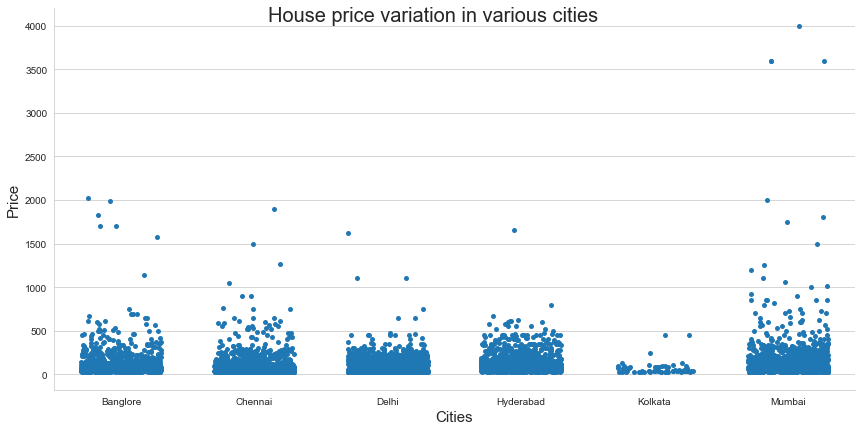

In [19]:
sns.set_style("whitegrid") # Background grid style
ax=sns.catplot(x='City', y='Price', data=df, jitter=0.3, height=6, aspect=2)

    
ax.fig.suptitle('House price variation in various cities', fontsize=20)
ax.set_xlabels('Cities',fontsize=15)
ax.set_ylabels('Price',fontsize=15)

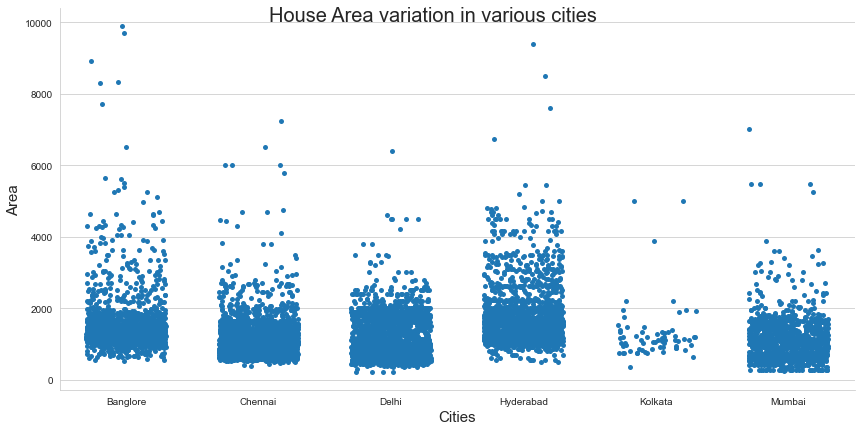

In [20]:
sns.set_style("whitegrid") # Background grid style
ax=sns.catplot(x='City', y='Area', data=df, jitter=0.3, height=6, aspect=2)

    
ax.fig.suptitle('House Area variation in various cities', fontsize=20)
ax.set_xlabels('Cities',fontsize=15)
ax.set_ylabels('Area',fontsize=15)

In [21]:
fig=px.scatter(data_frame=df, x='Area', y='Price', color='City', hover_name='Location')
fig.update_layout(title=dict(text='House price Vs. Area across Cities', xanchor='center', yanchor='top', x=0.5))
fig.show()

In [22]:
mumbai_city=pd.concat([data[['Price','Area']],data['City']=='Mumbai'],axis=1)
mumbai_city = mumbai_city.loc[mumbai_city['City'] == True]


In [23]:
#mumbai_city=mumbai_city.dropna
mumbai_city

,Price,Area,City
8088,48.5,720,True
8089,45.0,600,True
8090,67.0,650,True
8091,45.0,650,True
8092,50.0,665,True
...,...,...,...
9385,620.0,1450,True
9386,25.0,540,True
9387,190.0,1267,True
9388,149.0,1245,True


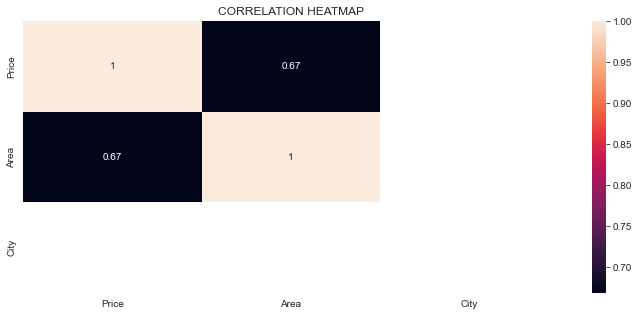

In [24]:
cor=mumbai_city.corr()
plt.figure(figsize=(12,5))
dataplot = sns.heatmap(cor, annot=True,)
plt.title('CORRELATION HEATMAP')
plt.show()

<__array_function__ internals>:180: RuntimeWarning:

Converting input from bool to <class 'numpy.uint8'> for compatibility.



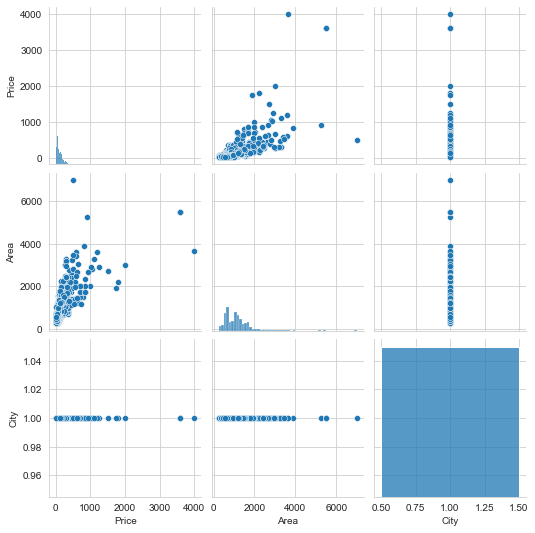

In [25]:
sns.pairplot(mumbai_city)

In [26]:
#we can see that the price and area are kind of related
'''A correlation coefficient of 0.67 indicates a moderate to strong positive linear relationship. 
The positive sign indicates a positive correlation, meaning that as one variable increases, 
the other tends to increase as well. The magnitude of 
0.67 suggests that the relationship is fairly strong, but not perfect.'''

'A correlation coefficient of 0.67 indicates a moderate to strong positive linear relationship. \nThe positive sign indicates a positive correlation, meaning that as one variable increases, \nthe other tends to increase as well. The magnitude of \n0.67 suggests that the relationship is fairly strong, but not perfect.'

In [27]:
from sklearn.model_selection import train_test_split
X=mumbai_city['Area']
y=mumbai_city['Price']


In [28]:
X_train ,X_test ,y_trian ,y_test =train_test_split(X,y,test_size=0.4,random_state=101)
#test size is the percentage of the data u want to allocate for testing tht is in thhis case 40%
#random_State specifies a random splits in the data 

In [29]:
from sklearn.linear_model import LinearRegression

In [30]:
lm = LinearRegression()


In [31]:
X_train= X_train.values.reshape(-1, 1)
X_test = X_test.values.reshape(-1, 1)

In [32]:
lm.fit(X_train, y_trian)

LinearRegression()

In [33]:
print(lm.intercept_) # basically the slope of the linear regression

-168.40503973880988


In [34]:
predictions =lm.predict(X_test)

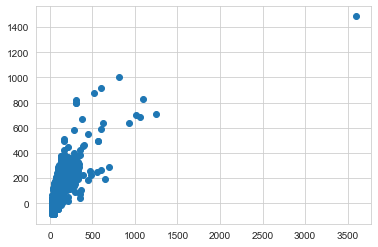

In [35]:
plt.scatter(y_test,predictions)

In [36]:
from sklearn import metrics
metrics.mean_squared_error(y_test,predictions)

21825.124062035335

In [37]:
#Now lets try to consider the city as well in this relation
City_data = data
City_data
City_data.drop([
  'Location',
  'No. of Bedrooms',
  'Resale',
  'MaintenanceStaff',
  'Gymnasium',
  'SwimmingPool',
  'LandscapedGardens',
  'JoggingTrack',
  'RainWaterHarvesting',
  'IndoorGames',
  'ShoppingMall',
  'Intercom',
  'SportsFacility',
  'ATM',
  'ClubHouse',
  'School',
  '24X7Security',
  'PowerBackup',
  'CarParking',
  'StaffQuarter',
  'Cafeteria',
  'MultipurposeRoom',
  'Hospital',
  'WashingMachine',
  'Gasconnection',
  'AC',
  'Wifi',
  "Children'splayarea",
  'LiftAvailable',
  'BED',
  'VaastuCompliant',
  'Microwave',
  'GolfCourse',
  'TV',
  'DiningTable',
  'Sofa',
  'Wardrobe',
  'Refrigerator',
  'City',
  'Latitude',
  'Longitude'],axis=1, inplace=True)

In [38]:
City_data

,id,Price,Area,Banglore,Chennai,Delhi,Hyderabad,Kolkata,Mumbai
0,0,300.00,3340,1,0,0,0,0,0
1,1,83.58,1675,1,0,0,0,0,0
2,2,68.45,1670,1,0,0,0,0,0
3,3,67.97,1220,1,0,0,0,0,0
4,4,200.00,2502,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
9385,24599,620.00,1450,0,0,0,0,0,1
9386,24600,25.00,540,0,0,0,0,0,1
9387,24601,190.00,1267,0,0,0,0,0,1
9388,24602,149.00,1245,0,0,0,0,0,1


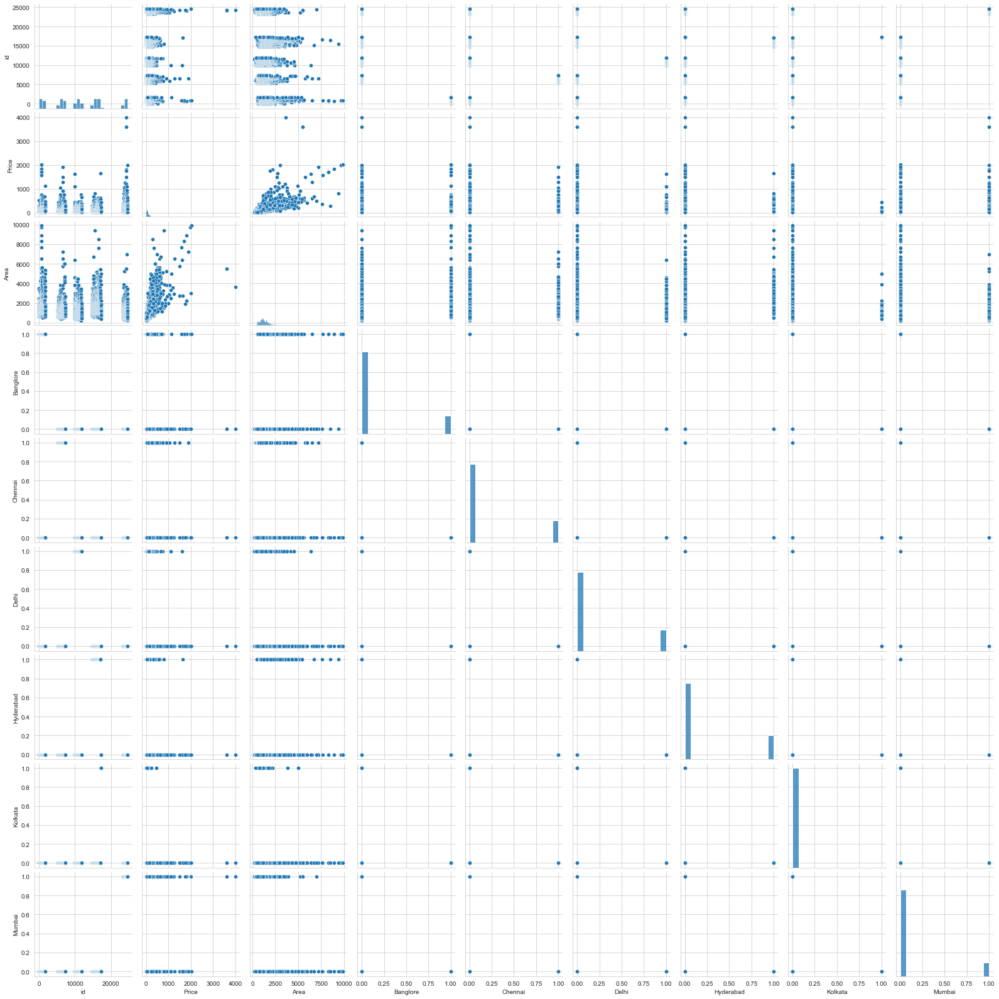

In [39]:
sns.pairplot(City_data)

C:\Users\kulu1\AppData\Local\Temp\ipykernel_12356\873270540.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



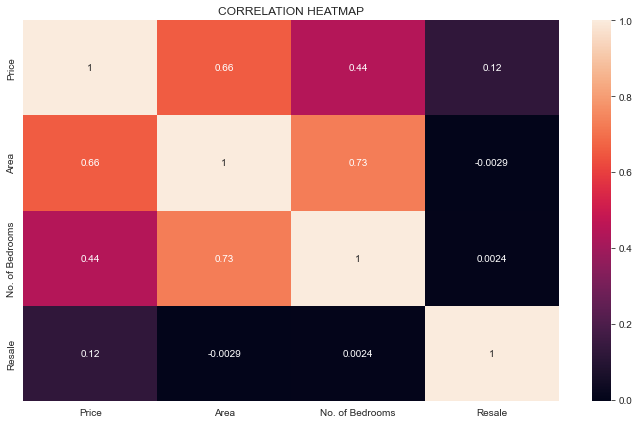

In [40]:
#We wont be focusing on specific location as we dont have enough data on each individual location so we will consider a broder prespective so we cann drop the location and latitude and longitude data
cor= df[['Price','City','Area','Location','No. of Bedrooms','Resale']].corr()
plt.figure(figsize=(12,7))
dataplot = sns.heatmap(cor, annot=True,)
plt.title('CORRELATION HEATMAP')
plt.show()

In [41]:
X1=df[['Area','No. of Bedrooms']]
y1=df['Price']
X1_train ,X1_test ,y1_trian ,y1_test =train_test_split(X,y,test_size=0.4,random_state=101)


In [42]:
lm = LinearRegression()

In [43]:
X1_train=X1_train.values.reshape(-1,1)


lm.fit(X1_train,y1_trian)


LinearRegression()

In [44]:
X1_test=X1_test.values.reshape(-1,1)
predictions =lm.predict(X1_test)

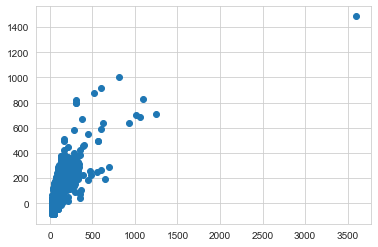

In [45]:
plt.scatter(y1_test,predictions)

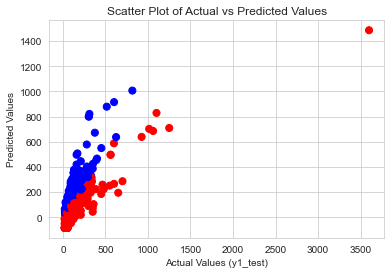

In [46]:
colors = ['blue' if actual < predicted else 'red' for actual, predicted in zip(y1_test, predictions)]

# Set the size of the markers
marker_size = 50

# Scatter plot
plt.scatter(y1_test, predictions, c=colors, s=marker_size)

# Add labels and title
plt.xlabel('Actual Values (y1_test)')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs Predicted Values')

# Show the plot
plt.show()

In [47]:
from sklearn.ensemble import GradientBoostingRegressor

# fitting the model
boosting = GradientBoostingRegressor(n_estimators=2000, max_depth=5, learning_rate=0.1)
print(boosting)
boosting.fit(X1_train, y1_trian)

# Evaluvating the score of the model
print("Score on training data:", boosting.score(X1_train,y1_trian))
print("Score on validation data:", boosting.score(X1_test,y1_test))

GradientBoostingRegressor(max_depth=5, n_estimators=2000)
Score on training data: 0.9268321789196892
Score on validation data: -0.10370972698600522


In [48]:
import folium
from folium.plugins import HeatMap, MarkerCluster
from folium import Choropleth, Circle, Marker
city_map = folium.Map(location=[19.08,72.74], zoom_start=10, tiles='cartodbpositron')

mc=MarkerCluster()
for idx, row in df.iterrows():
    popup_text = row['Location']
    mc.add_child(Marker((row['Latitude'], row['Longitude']),popup=popup_text))
    
city_map.add_child(mc)
city_map

In [49]:
fig=px.bar(data_frame=df, x='No. of Bedrooms', y='Price', color='City',barmode='relative')
fig.update_layout(title=dict(text='Average house price variation across Cities', xanchor='center', yanchor='top', x=0.5))

In [50]:
# we can try to improve the lm model by removing outliers in the data set 

In [51]:
df2=pd.concat([City_data,df['No. of Bedrooms'],df['City']],axis=1)


In [52]:
df2

,id,Price,Area,Banglore,Chennai,Delhi,Hyderabad,Kolkata,Mumbai,No. of Bedrooms,City
0,0,300.00,3340,1,0,0,0,0,0,4.0,Banglore
1,1,83.58,1675,1,0,0,0,0,0,3.0,Banglore
2,2,68.45,1670,1,0,0,0,0,0,3.0,Banglore
3,3,67.97,1220,1,0,0,0,0,0,2.0,Banglore
4,4,200.00,2502,1,0,0,0,0,0,4.0,Banglore
...,...,...,...,...,...,...,...,...,...,...,...
9385,24599,620.00,1450,0,0,0,0,0,1,3.0,Mumbai
9386,24600,25.00,540,0,0,0,0,0,1,1.0,Mumbai
9387,24601,190.00,1267,0,0,0,0,0,1,3.0,Mumbai
9388,24602,149.00,1245,0,0,0,0,0,1,2.0,Mumbai


In [53]:
df3 =df2.copy()
df3['price+per_sqft']=df3['Price']*100000 / df3['Area']
df3.head()

,id,Price,Area,Banglore,Chennai,Delhi,Hyderabad,Kolkata,Mumbai,No. of Bedrooms,City,price+per_sqft
0,0,300.00,3340,1,0,0,0,0,0,4.0,Banglore,8982.035928
1,1,83.58,1675,1,0,0,0,0,0,3.0,Banglore,4989.850746
2,2,68.45,1670,1,0,0,0,0,0,3.0,Banglore,4098.802395
3,3,67.97,1220,1,0,0,0,0,0,2.0,Banglore,5571.311475
4,4,200.00,2502,1,0,0,0,0,0,4.0,Banglore,7993.605116


In [54]:
df3['price+per_sqft'].describe()

count      9390.000000
mean       7204.356095
std        5012.280073
min        2000.000000
25%        4545.454545
50%        5709.541745
75%        8278.380055
max      109950.522265
Name: price+per_sqft, dtype: float64

In [55]:
df3[df3['Area']/df3['No. of Bedrooms'] < 300].head()

,id,Price,Area,Banglore,Chennai,Delhi,Hyderabad,Kolkata,Mumbai,No. of Bedrooms,City,price+per_sqft
1404,1404,41.00,1055,1,0,0,0,0,0,4.0,Banglore,3886.255924
2002,5612,22.59,572,0,1,0,0,0,0,2.0,Chennai,3949.300699
2076,5686,25.00,570,0,1,0,0,0,0,2.0,Chennai,4385.964912
2295,5905,66.00,697,0,1,0,0,0,0,3.0,Chennai,9469.153515
2306,5916,29.82,590,0,1,0,0,0,0,2.0,Chennai,5054.237288


In [56]:
df3.shape

(9390, 12)

In [57]:
df4 =df3[~(df3['Area']/df3['No. of Bedrooms'] < 300)]
df4.shape


(8893, 12)

In [58]:
df4['price+per_sqft'].describe()

count      8893.000000
mean       7263.696749
std        5073.416618
min        2000.000000
25%        4516.666667
50%        5799.999167
75%        8356.545961
max      109950.522265
Name: price+per_sqft, dtype: float64

In [59]:
#trying to remove more outliers using standard deviation and mean values


In [60]:
def remove_outliers(df):
    df_out = pd.DataFrame()
    for key,subdf in df.groupby('City'):
        m=np.mean(subdf['price+per_sqft'])
        st=np.std(subdf['price+per_sqft'])
        reduced_df =subdf[(subdf['price+per_sqft']>(m-st)) & (subdf['price+per_sqft']<=(m+st))]
        df_out=pd.concat([df_out,reduced_df],ignore_index=True)
    return df_out
df5 = remove_outliers(df4)
df5.shape
        

(7516, 12)

In [61]:
df5['price+per_sqft'].describe()


count     7516.000000
mean      6483.987947
std       2942.445864
min       2699.465241
25%       4598.780488
50%       5600.930233
75%       7363.486842
max      21729.729189
Name: price+per_sqft, dtype: float64

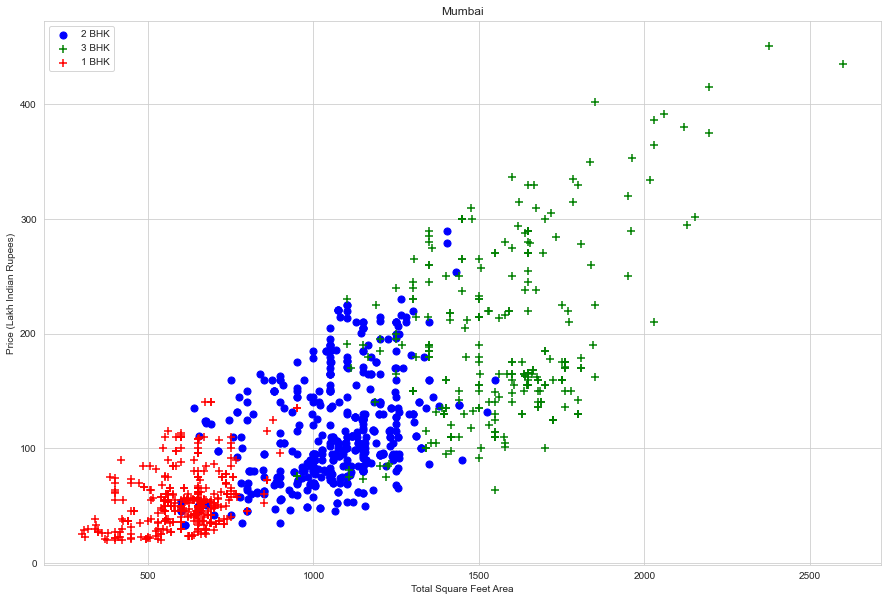

In [62]:
def plot_scatter_chart(df,location):
    bhk2 = df[(df.City==location) & (df['No. of Bedrooms']==2.0)]
    bhk3 = df[(df.City==location) & (df['No. of Bedrooms']==3.0)]
    bhk1 = df[(df.City==location) & (df['No. of Bedrooms']==1.0)]
    plt.rcParams['figure.figsize'] = (15,10)
    plt.scatter(bhk2.Area,bhk2.Price,color='blue',label='2 BHK', s=50)
    plt.scatter(bhk3.Area,bhk3.Price,marker='+', color='green',label='3 BHK', s=50)
    plt.scatter(bhk1.Area,bhk1.Price,marker='+', color='red',label='1 BHK', s=50)
    plt.xlabel("Total Square Feet Area")
    plt.ylabel("Price (Lakh Indian Rupees)")
    plt.title(location)
    plt.legend()
    
plot_scatter_chart(df5,"Mumbai")

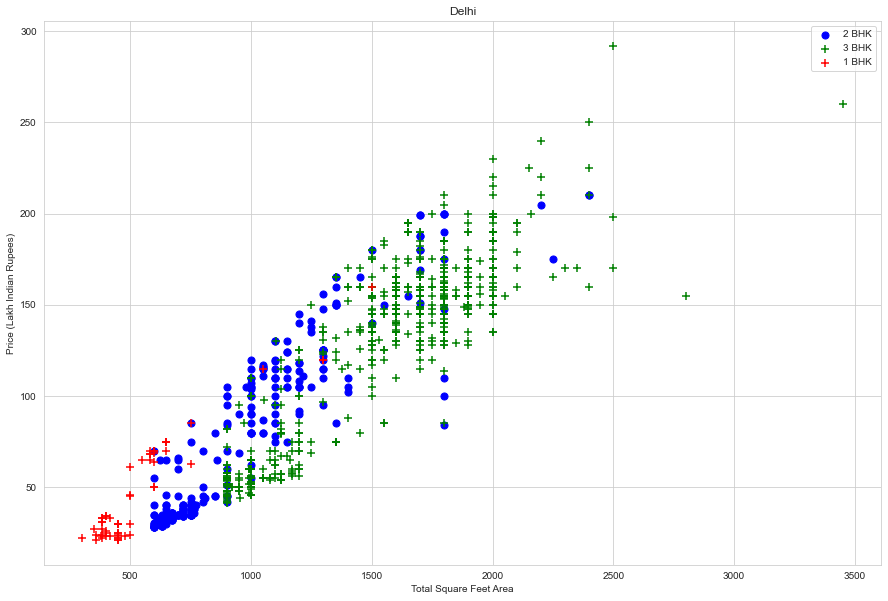

In [63]:
plot_scatter_chart(df5,'Delhi')

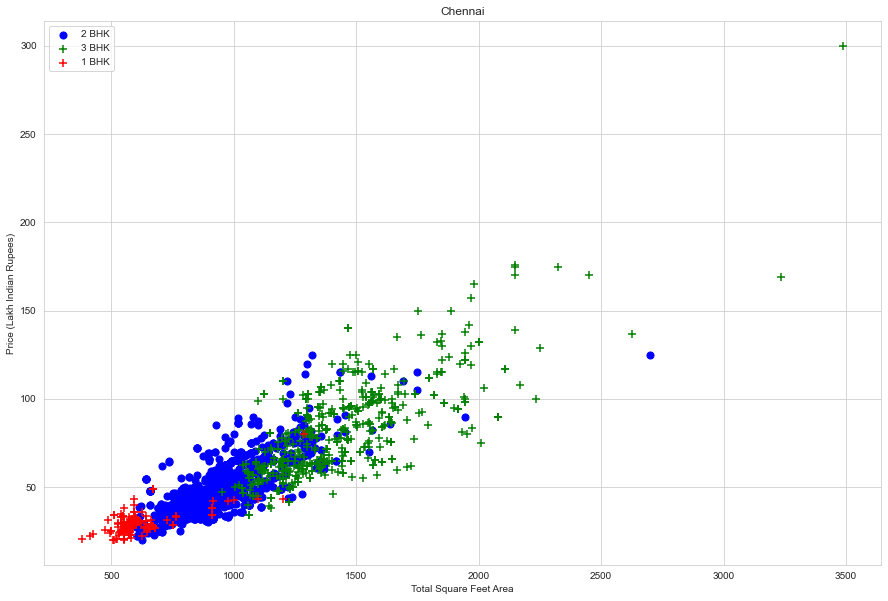

In [64]:
plot_scatter_chart(df5,'Chennai')

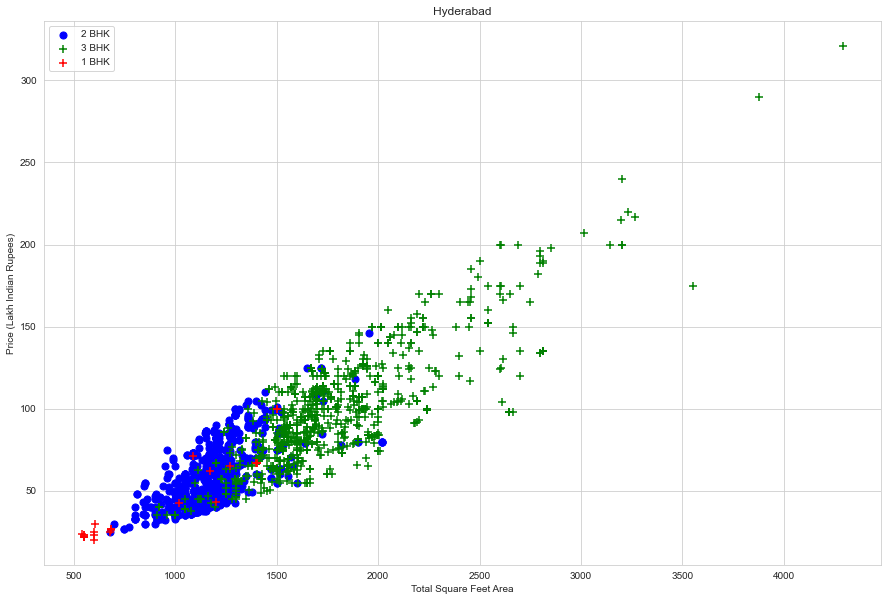

In [65]:
plot_scatter_chart(df5,'Hyderabad')

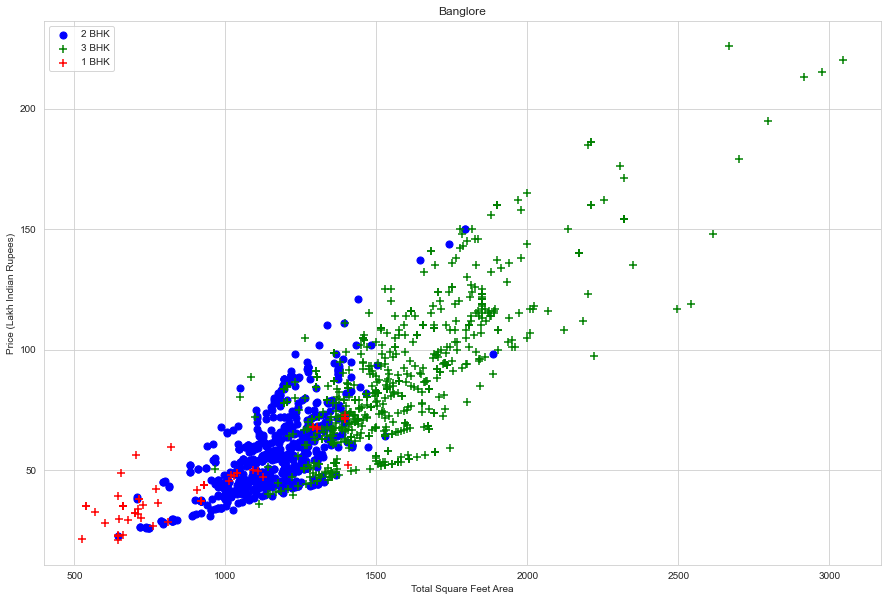

In [66]:
plot_scatter_chart(df5,'Banglore')

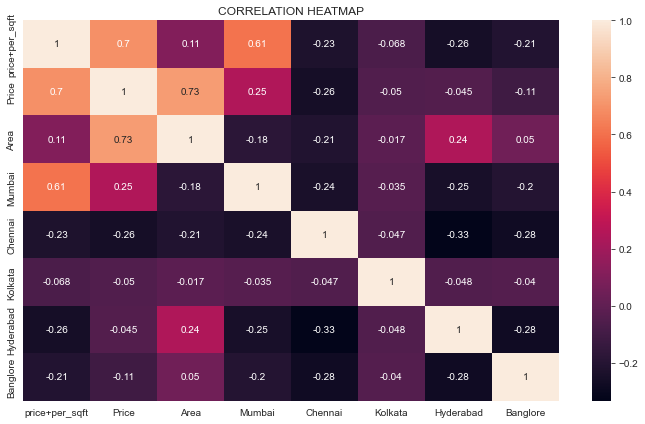

In [136]:
cor= df5[['price+per_sqft','Price','Area','Mumbai','Chennai','Kolkata','Hyderabad','Banglore']].corr()
plt.figure(figsize=(12,7))
dataplot = sns.heatmap(cor, annot=True,)
plt.title('CORRELATION HEATMAP')
plt.show()

Here we can see that the correlational value between the price and area of the house has increased quite significantly when compared with previous values we had calculated earlier 
we do still have a copule of outliers in this data set which might not be advisable for overall analysis when the data is being put through a regression model ....

PREDICT FUNCTION

In [194]:
def predic(df5,city):
    city_rows=df5[df5['City']==city]
    selected_columns=['Price','Area']
    city_rows=city_rows[selected_columns]
    x=city_rows['Price']
    y=city_rows['Area']
    
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.4,random_state=101)
    x_train=x_train.values.reshape(-1,1)
    x_test=x_test.values.reshape(-1,1)
    lm.fit(x_train,y_train)
    predictions=lm.predict(x_test)
    prediction= pd.DataFrame({
    'prediction': predictions,
    'y_Test': y_test
    })
    return prediction

In [195]:
def perform(y_pred,y_test1):
    print("MSE",round(mean_squared_error(y_test1,y_pred), 3))
    print("RMSE",round(np.sqrt(mean_squared_error(y_test1,y_pred)), 3))
    print("MAE",round(mean_absolute_error(y_test1,y_pred), 3))
    print("MAPE",round(mean_absolute_percentage_error(y_test1,y_pred), 3))
    print("R2 Score : ", round(r2_score(y_test1,y_pred), 3))

In [198]:
def display():
    for i in ['Mumbai','Banglore','Chennai','Hyderabad','Delhi'] :
        predictions =predic(df5,i)
        print("Analysis of predicitons for city "+i+":")
        print()
        perform(predictions['prediction'],predictions['y_Test'])
        print()



In [199]:
display()

Analysis of predicitons for city Mumbai:

MSE 73782.523
RMSE 271.629
MAE 214.622
MAPE 0.221
R2 Score :  0.716

Analysis of predicitons for city Banglore:

MSE 34162.8
RMSE 184.832
MAE 139.87
MAPE 0.102
R2 Score :  0.841

Analysis of predicitons for city Chennai:

MSE 28518.013
RMSE 168.873
MAE 123.86
MAPE 0.115
R2 Score :  0.853

Analysis of predicitons for city Hyderabad:

MSE 71361.278
RMSE 267.135
MAE 178.682
MAPE 0.116
R2 Score :  0.766

Analysis of predicitons for city Delhi:

MSE 48130.419
RMSE 219.386
MAE 169.309
MAPE 0.138
R2 Score :  0.87

